In [1]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import json
import time
import requests
from datetime import datetime, timedelta
from shapely.geometry import Point
from busSim import BusSim
from graph import Graph

In [2]:
DATA_PATH = "../data"
DAY = "monday"
START_TIME = "10:00:00"
ELAPSE_TIME = "00:30:00"
AVG_WALKING_SPEED = 1.4 # 1.4 meters per second
MAX_WALKING_MIN = 10

3132638.580138589

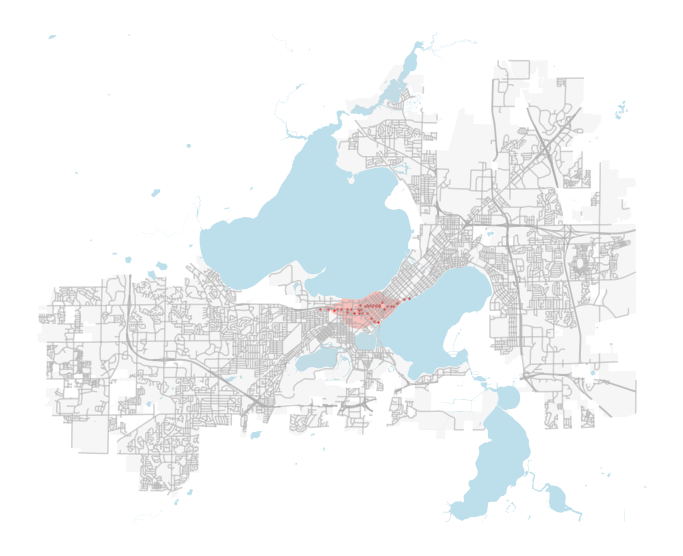

In [3]:
busSim = BusSim(DATA_PATH, DAY, START_TIME, ELAPSE_TIME, AVG_WALKING_SPEED, MAX_WALKING_MIN, route_remove=[80])
gdf = busSim.get_gdf(765)
city = gpd.read_file("../data/plot/background/madison-shp")
lakes = gpd.read_file("../data/plot/background/water-shp")
street = gpd.read_file("../data/plot/background/street-shp")

ax = city.plot(color="lightgray", alpha=.2, figsize=(12, 12), zorder=2)
lakes.plot(color="lightblue", ax=ax, zorder=1, alpha=0.8)
street.plot(color="darkgray", alpha = .5, ax=ax, zorder=3)
gdf.difference(lakes.unary_union).plot(color="#ffbfba", ax=ax)
gdf["geometry"].centroid.plot(color="red", ax=ax, markersize=2)

ax.set_axis_off()
busSim.get_area(gdf)

21786807.680050697

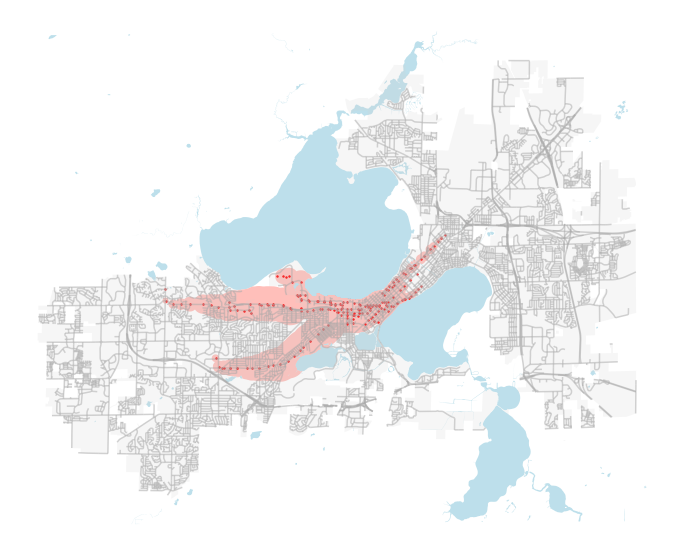

In [4]:
busSim = BusSim(DATA_PATH, DAY, START_TIME, ELAPSE_TIME, AVG_WALKING_SPEED, MAX_WALKING_MIN)
gdf = busSim.get_gdf(765)
city = gpd.read_file("../data/plot/background/madison-shp")
lakes = gpd.read_file("../data/plot/background/water-shp")
street = gpd.read_file("../data/plot/background/street-shp")

ax = city.plot(color="lightgray", alpha=.2, figsize=(12, 12), zorder=2)
lakes.plot(color="lightblue", ax=ax, zorder=1, alpha=0.8)
street.plot(color="darkgray", alpha = .5, ax=ax, zorder=3)
gdf.difference(lakes.unary_union).plot(color="#ffbfba", ax=ax)
gdf["geometry"].centroid.plot(color="red", ax=ax, markersize=2)

ax.set_axis_off()
busSim.get_area(gdf)

In [5]:
df = busSim.stopTimes_final_df
df[df["stop_id"] == 765]

,service_id,route_short_name,trip_id,stop_id,stop_sequence,arrival_time,shape_dist_traveled,stop_lat,stop_lon,cardinal_direction
13928,93_WKD:S,80,1024695,765,29,0 days 10:03:18,4.4919,43.073076,-89.397291,0.0
13929,93_WKD:S,80,1024696,765,29,0 days 10:08:18,4.4919,43.073076,-89.397291,0.0
13930,93_WKD:S,80,1024697,765,29,0 days 10:13:18,4.4919,43.073076,-89.397291,0.0
13822,93_WKD,4,1019659,765,20,0 days 10:17:43,3.5628,43.073076,-89.397291,0.0
13931,93_WKD:S,80,1024698,765,29,0 days 10:18:18,4.4919,43.073076,-89.397291,0.0
13852,93_WKD,6,1020066,765,30,0 days 10:20:59,5.0204,43.073076,-89.397291,0.0
13932,93_WKD:S,80,1024699,765,29,0 days 10:23:18,4.4919,43.073076,-89.397291,0.0
13933,93_WKD:S,80,1024700,765,29,0 days 10:28:18,4.4919,43.073076,-89.397291,0.0


20682522.238682237

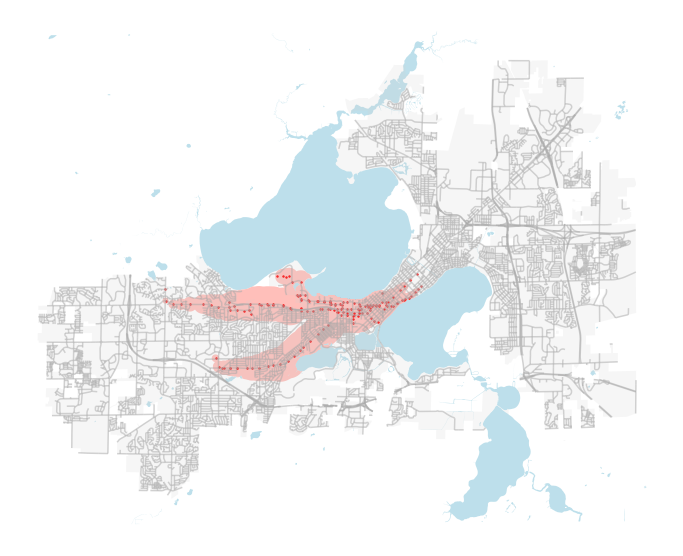

In [6]:
busSim = BusSim(DATA_PATH, DAY, START_TIME, ELAPSE_TIME, AVG_WALKING_SPEED, MAX_WALKING_MIN, trip_delays=[(1024695, "00:04:00")])
gdf = busSim.get_gdf(765)
city = gpd.read_file("../data/plot/background/madison-shp")
lakes = gpd.read_file("../data/plot/background/water-shp")
street = gpd.read_file("../data/plot/background/street-shp")

ax = city.plot(color="lightgray", alpha=.2, figsize=(12, 12), zorder=2)
lakes.plot(color="lightblue", ax=ax, zorder=1, alpha=0.8)
street.plot(color="darkgray", alpha = .5, ax=ax, zorder=3)
gdf.difference(lakes.unary_union).plot(color="#ffbfba", ax=ax)
gdf["geometry"].centroid.plot(color="red", ax=ax, markersize=2)

ax.set_axis_off()
busSim.get_area(gdf)